In [132]:
import pm4py
import os

os.environ["PATH"] += os.pathsep + "/opt/homebrew/bin"

In [133]:
file_path = '../data/BPI_Challenge_2019-3-w-after.xes'
log = pm4py.read_xes(file_path=file_path)
event_log = pm4py.convert_to_event_log(log)

In [134]:
dfg, sa, ea = pm4py.discover_directly_follows_graph(event_log)
dfg

Counter({('Record Service Entry Sheet', 'Record Service Entry Sheet'): 139107,
         ('Record Goods Receipt', 'Record Goods Receipt'): 40624,
         ('Record Goods Receipt', 'Record Service Entry Sheet'): 23151,
         ('Record Service Entry Sheet', 'Record Goods Receipt'): 19183,
         ('Record Invoice Receipt', 'Clear Invoice'): 9427,
         ('Vendor creates invoice', 'Record Goods Receipt'): 6777,
         ('Create Purchase Order Item', 'Record Goods Receipt'): 6399,
         ('Vendor creates invoice', 'Record Invoice Receipt'): 5670,
         ('Record Goods Receipt', 'Record Invoice Receipt'): 5657,
         ('Create Purchase Order Item', 'Vendor creates invoice'): 4442,
         ('Record Invoice Receipt', 'Record Invoice Receipt'): 3579,
         ('Record Goods Receipt', 'Vendor creates invoice'): 3567,
         ('Record Service Entry Sheet', 'Vendor creates invoice'): 2823,
         ('Record Invoice Receipt', 'Remove Payment Block'): 2179,
         ('Create Purchase O

In [135]:
pm4py.view_dfg(dfg=dfg, start_activities=sa, end_activities=ea)

In [136]:
number_cases = len(event_log)
print("Number of cases", number_cases)

Number of cases 15182


Start activities:  {'SRM: Created': 564, 'Vendor creates invoice': 356, 'Vendor creates debit memo': 8, 'Create Purchase Order Item': 13035, 'Create Purchase Requisition Item': 1219}
End activities:  {'SRM: Transfer Failed (E.Sys.)': 44, 'SRM: Change was Transmitted': 38, 'Change Delivery Indicator': 33, 'Clear Invoice': 9258, 'SRM: In Transfer to Execution Syst.': 26, 'Record Service Entry Sheet': 921, 'Create Purchase Order Item': 220, 'Record Invoice Receipt': 1330, 'Vendor creates debit memo': 1, 'Change Final Invoice Indicator': 1, 'SRM: Transaction Completed': 5, 'Remove Payment Block': 256, 'Cancel Invoice Receipt': 84, 'Change Price': 74, 'Delete Purchase Order Item': 302, 'Set Payment Block': 58, 'Record Goods Receipt': 2319, 'Cancel Goods Receipt': 168, 'Cancel Subsequent Invoice': 3, 'Vendor creates invoice': 5, 'SRM: Deleted': 9, 'Reactivate Purchase Order Item': 1, 'Change Quantity': 20, 'Change Approval for Purchase Order': 6}


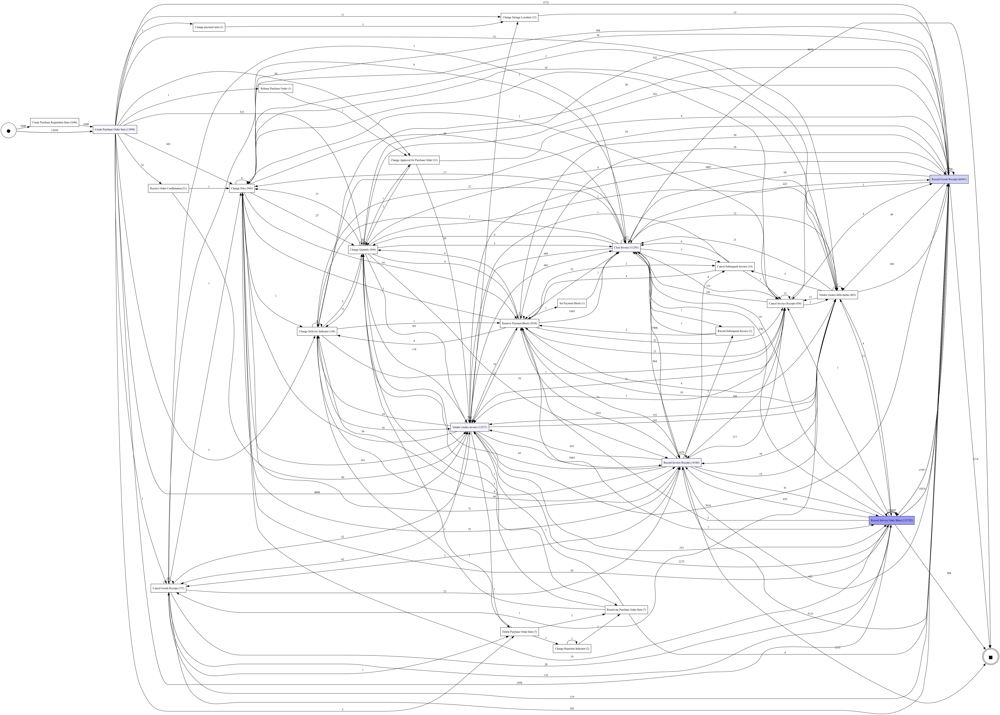

In [137]:
start_activities = pm4py.get_start_activities(event_log)
end_activities = pm4py.get_end_activities(event_log)

print("Start activities: ", start_activities)
print("End activities: ", end_activities)

filtered_log = pm4py.filter_start_activities(event_log, [sa for sa, freq in start_activities.items() if freq/number_cases >= 0.05 ])
filtered_log = pm4py.filter_end_activities(filtered_log, [ea for ea, freq in end_activities.items() if freq/number_cases >= 0.05])


dfg_filtered, sa_filtered, ea_filtered = pm4py.discover_directly_follows_graph(filtered_log)

pm4py.view_dfg(dfg_filtered, sa_filtered, ea_filtered)

In [140]:
variants = pm4py.get_variants(filtered_log)
print("Number of variants: ", len(variants))
sorted_variants = sorted([len(variant) for variant in variants])[::-1]
print("Length of variants: ", sorted_variants)

perc = 0.01
filtered_log = pm4py.filter_variants_by_coverage_percentage(filtered_log, perc)
print(len(filtered_log))




Number of variants:  15
Length of variants:  [7, 6, 6, 6, 6, 6, 6, 6, 5, 5, 4, 4, 3, 3, 2]
7199


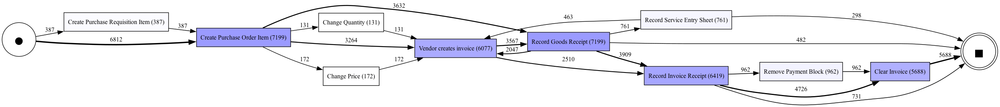

In [141]:
dfg_filtered, sa_filtered, ea_filtered = pm4py.discover_directly_follows_graph(filtered_log)

pm4py.view_dfg(dfg_filtered, sa_filtered, ea_filtered)

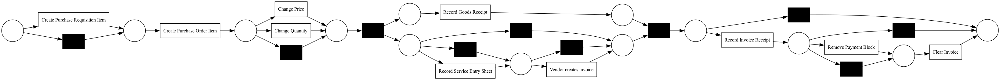

In [142]:
net, initial_marking, final_marking = pm4py.discover_petri_net_inductive(filtered_log)
pm4py.view_petri_net(net)

{'Create Purchase Order Item': 7199, 'Vendor creates invoice': 6077, 'Record Goods Receipt': 7199, 'Record Invoice Receipt': 6419, 'Clear Invoice': 5688, 'Change Price': 172, 'Remove Payment Block': 962, 'Record Service Entry Sheet': 761, 'Create Purchase Requisition Item': 387, 'Change Quantity': 131}


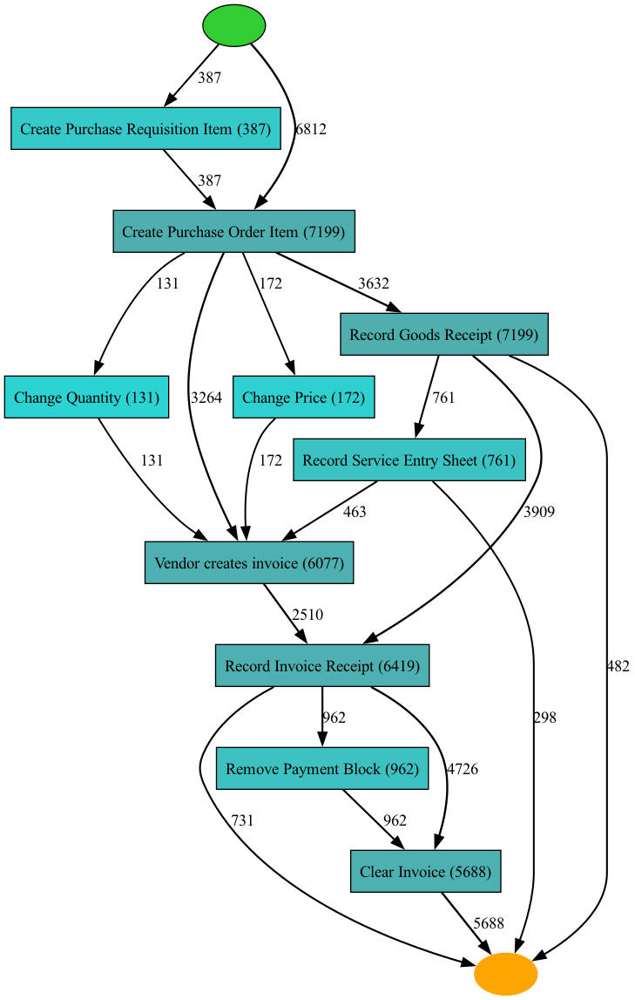

In [145]:
heu_net = pm4py.discover_heuristics_net(filtered_log, dependency_threshold=0.99)
print(heu_net.activities_occurrences)
pm4py.view_heuristics_net(heu_net)